In [ ]:
%%capture
import os
if "COLAB_" not in "".join(os.environ.keys()):
    !pip install unsloth
else:
    # Do this only in Colab notebooks! Otherwise use pip install unsloth
    !pip install --no-deps bitsandbytes accelerate xformers==0.0.29.post3 peft trl triton cut_cross_entropy unsloth_zoo
    !pip install sentencepiece protobuf "datasets>=3.4.1,<4.0.0" huggingface_hub hf_transfer
    !pip install --no-deps unsloth

In [ ]:
%%capture
# Install latest transformers for Gemma 3N
!pip install --no-deps transformers==4.53.1 # Only for Gemma 3N
!pip install --no-deps --upgrade timm # Only for Gemma 3N

In [ ]:
from unsloth import FastVisionModel # FastLanguageModel for LLMs
from transformers import AutoTokenizer, AutoModelForVision2Seq, TextStreamer, AutoProcessor
import torch

model, processor = FastVisionModel.from_pretrained(
    "unsloth/gemma-3n-E2B-it",
    load_in_4bit = True, # Use 4bit to reduce memory use. False for 16bit LoRA.
    use_gradient_checkpointing = "unsloth", # True or "unsloth" for long context
)

🦥 Unsloth: Will patch your computer to enable 2x faster free finetuning.
🦥 Unsloth Zoo will now patch everything to make training faster!
==((====))==  Unsloth 2025.8.1: Fast Gemma3N patching. Transformers: 4.53.1.
   \\   /|    Tesla T4. Num GPUs = 1. Max memory: 14.741 GB. Platform: Linux.
O^O/ \_/ \    Torch: 2.6.0+cu124. CUDA: 7.5. CUDA Toolkit: 12.4. Triton: 3.2.0
\        /    Bfloat16 = FALSE. FA [Xformers = 0.0.29.post3. FA2 = False]
 "-____-"     Free license: http://github.com/unslothai/unsloth
Unsloth: Fast downloading is enabled - ignore downloading bars which are red colored!
Unsloth: Gemma3N does not support SDPA - switching to eager!


model.safetensors.index.json: 0.00B [00:00, ?B/s]

model-00001-of-00003.safetensors:   0%|          | 0.00/2.65G [00:00<?, ?B/s]

model-00002-of-00003.safetensors:   0%|          | 0.00/4.99G [00:00<?, ?B/s]

model-00003-of-00003.safetensors:   0%|          | 0.00/469M [00:00<?, ?B/s]

Loading checkpoint shards:   0%|          | 0/3 [00:00<?, ?it/s]

generation_config.json:   0%|          | 0.00/210 [00:00<?, ?B/s]

processor_config.json:   0%|          | 0.00/98.0 [00:00<?, ?B/s]

chat_template.jinja: 0.00B [00:00, ?B/s]

preprocessor_config.json: 0.00B [00:00, ?B/s]

tokenizer_config.json: 0.00B [00:00, ?B/s]

tokenizer.model:   0%|          | 0.00/4.70M [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/33.4M [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/777 [00:00<?, ?B/s]

In [ ]:
# Step 2: Manually load the LoRA weights
model.load_adapter("gigwegbe/gemma-3n-E2B-it-finetuned-adapters")

# Step 3: Switch to inference mode
FastVisionModel.for_inference(model)


adapter_config.json: 0.00B [00:00, ?B/s]

/usr/local/lib/python3.11/dist-packages/peft/config.py:165: UserWarning: Unexpected keyword arguments ['target_parameters'] for class LoraConfig, these are ignored. This probably means that you're loading a configuration file that was saved using a higher version of the library and additional parameters have been introduced since. It is highly recommended to upgrade the PEFT version before continuing (e.g. by running `pip install -U peft`).
  warnings.warn(


adapter_model.safetensors:   0%|          | 0.00/84.6M [00:00<?, ?B/s]

Gemma3nForConditionalGeneration(
  (model): Gemma3nModel(
    (vision_tower): TimmWrapperModel(
      (timm_model): MobileNetV5Encoder(
        (conv_stem): ConvNormAct(
          (conv): Conv2dSame(3, 64, kernel_size=(3, 3), stride=(2, 2))
          (bn): RmsNormAct2d(
            (drop): Identity()
            (act): GELU(approximate='tanh')
          )
        )
        (blocks): Sequential(
          (0): Sequential(
            (0): EdgeResidual(
              (conv_exp): Conv2dSame(64, 256, kernel_size=(3, 3), stride=(2, 2), bias=False)
              (bn1): RmsNormAct2d(
                (drop): Identity()
                (act): GELU(approximate='tanh')
              )
              (aa): Identity()
              (se): Identity()
              (conv_pwl): Conv2d(256, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
              (bn2): RmsNormAct2d(
                (drop): Identity()
                (act): Identity()
              )
              (drop_path): Identity()
       

In [ ]:
from PIL import Image

# Prepare input
image = Image.open("t1-ans.jpg").convert("RGB")  # Load your test image
ant = "scratch | Conf: 0.55 | Area: 49526 | Score: 54626 | BBox: (306.3816223144531, 439.2350769042969, 629.4544677734375, 592.5305786132812)"

In [ ]:
# image

In [ ]:
CLASS_WEIGHTS = {
    "dent": 2.0,
    "scratch": 2.0,
    "crack": 3.0,
    "glass shatter": 5.0,
    "lamp broken": 3.5,
    "tire flat": 1.0
}

In [ ]:
ans = """🔧 Ranked Detections by Severity:
glass shatter | Conf: 0.62 | Area: 339997 | Score: 944693 | BBox: (179.0260009765625, 136.43240356445312, 819.842529296875, 667.0)
scratch | Conf: 0.35 | Area: 82880 | Score: 43127 | BBox: (585.1806030273438, 82.36738586425781, 999.3623046875, 282.4722900390625)"""

instruction = f"""You are an expert automobile inspector.
Review the image and verify whether the car damages shown are consistent with the following object detection results (ranked by severity):

{ans} Recall: {CLASS_WEIGHTS}

For each detected damage, return your analysis in the following structured format:

{{
    "general_description": <Long detailed assessment of the damages, its location and severity>,
    "damage_type": <type of damage, e.g., 'glass shatter'>,
    "qualitative_description_of_size_of_damage": <e.g., 'large', 'medium', 'minor'>,
    "technical_description_location_of_damage": <specific part of the car affected, e.g., 'front windshield, lower right'>,
    "recommendation_for_fix": <e.g., 'Replace the windshield', 'Polish the surface'>,
    "estimated_time_of_repair": <e.g., '2–3 hours of labor', '30 minutes for polishing'>
}}

Only include entries that are visible in the image. Be as precise and professional as possible.
"""


In [ ]:


# === Apply chat template ===
messages = [
    {
        "role": "user",
        "content": [
            {"type": "image", "image": image},
            {"type": "text", "text": instruction}
        ],
    }
]

# This returns a string formatted for chat prompting
input_text = processor.apply_chat_template(messages, add_generation_prompt=True)

# === Tokenize multimodal input ===
inputs = processor(
    text=input_text,
    images=image,
    return_tensors="pt"
).to("cuda")  # or "cpu" if needed

# === Generate and stream output ===
streamer = TextStreamer(processor.tokenizer, skip_prompt=True)

outputs = model.generate(
    **inputs,
    streamer=streamer,
    max_new_tokens=256,
    use_cache=True,
    temperature=1.0,
    # temperature=0.1,
    top_p=0.95,
    top_k=64,
)


```json
{
    "general_description": "The image shows a dent on the side of the car near the rear door. The dent appears to be relatively shallow.",
    "damage_type": "dent",
    "qualitative_description_of_size_of_damage": "minor",
    "technical_description_location_of_damage": "Side of the car, near the rear door",
    "recommendation_for_fix": "Minor bodywork",
    "estimated_time_of_repair": "30 minutes for paint touch-up"
}
```<end_of_turn>


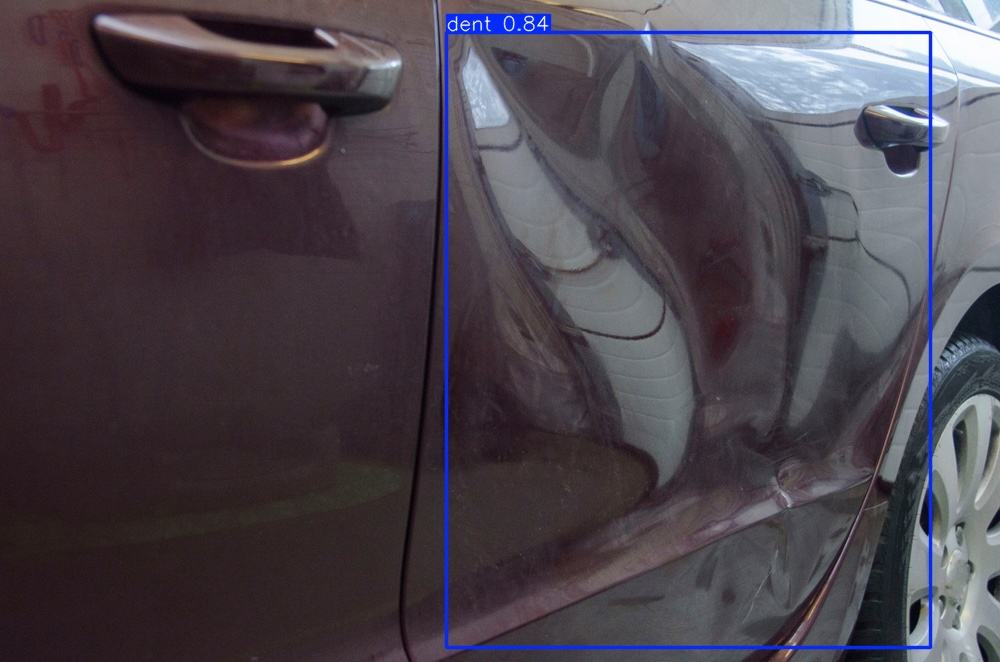

In [ ]:
# First image
image

In [ ]:
# === Load and Prepare Image ===
image = Image.open("t2-ans.jpg").convert("RGB")


ans = """
🔧 Ranked Detections by Severity:
scratch | Conf: 0.79 | Area: 130104 | Score: 205556 | BBox: (330.7876892089844, 261.2967834472656, 767.217529296875, 559.406494140625)
"""

instruction = f"""You are an expert automobile inspector.
Review the image and verify whether the car damages shown are consistent with the following object detection results (ranked by severity):

{ans} Recall: {CLASS_WEIGHTS}

For each detected damage, return your analysis in the following structured format:

{{
    "general_description": <Long detailed assessment of the damages, its location and severity>,
    "damage_type": <type of damage, e.g., 'glass shatter'>,
    "qualitative_description_of_size_of_damage": <e.g., 'large', 'medium', 'minor'>,
    "technical_description_location_of_damage": <specific part of the car affected, e.g., 'front windshield, lower right'>,
    "recommendation_for_fix": <e.g., 'Replace the windshield', 'Polish the surface'>,
    "estimated_time_of_repair": <e.g., '2–3 hours of labor', '30 minutes for polishing'>
}}

Only include entries that are visible in the image. Be as precise and professional as possible.
"""

In [ ]:


# === Apply chat template ===
messages = [
    {
        "role": "user",
        "content": [
            {"type": "image", "image": image},
            {"type": "text", "text": instruction}
        ],
    }
]

# This returns a string formatted for chat prompting
input_text = processor.apply_chat_template(messages, add_generation_prompt=True)

# === Tokenize multimodal input ===
inputs = processor(
    text=input_text,
    images=image,
    return_tensors="pt"
).to("cuda")  # or "cpu" if needed

# === Generate and stream output ===
streamer = TextStreamer(processor.tokenizer, skip_prompt=True)

outputs = model.generate(
    **inputs,
    streamer=streamer,
    max_new_tokens=256,
    use_cache=True,
    temperature=1.0,
    top_p=0.95,
    top_k=64,
)


```json
{
    "general_description": "The vehicle exhibits a noticeable scratch on the side panel, located near the rear wheel. The scratch appears to be relatively shallow.",
    "damage_type": "scratch",
    "qualitative_description_of_size_of_damage": "minor",
    "technical_description_location_of_damage": "Rear side panel",
    "recommendation_for_fix": "Inspect the scratch for paint damage. If minor, polishing may be sufficient. Otherwise, consider touch-up paint.",
    "estimated_time_of_repair": "30 minutes for polishing"
}
```<end_of_turn>


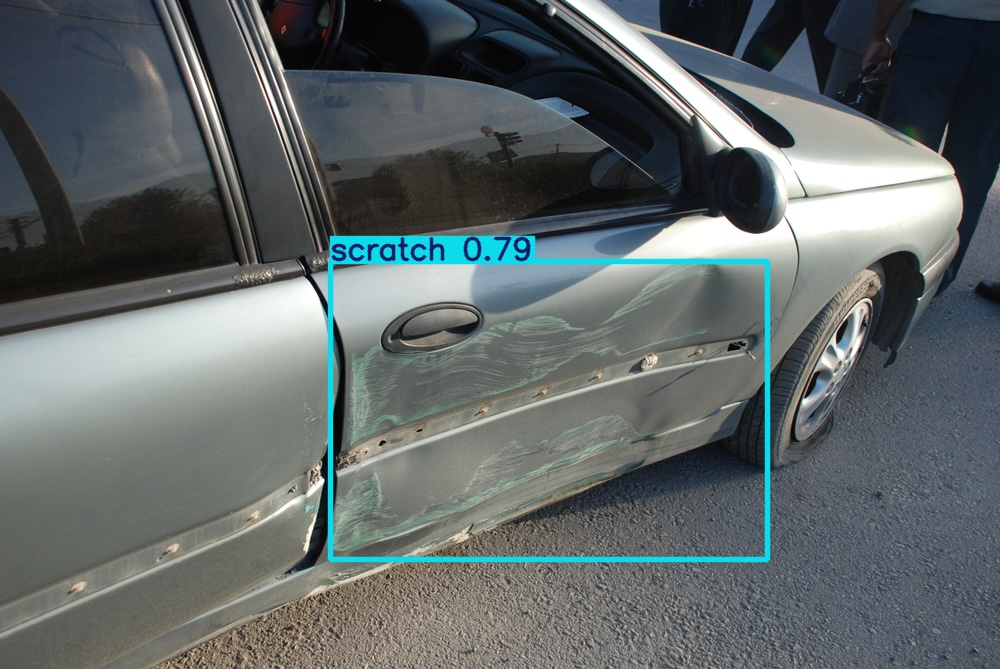

In [ ]:
# Second image
image

In [ ]:
# === Load and Prepare Image ===
image = Image.open("t3-ans.jpg").convert("RGB")


ans = """
🔧 Ranked Detections by Severity:
scratch | Conf: 0.75 | Area: 51496 | Score: 77113 | BBox: (102.18095397949219, 378.3528137207031, 515.8108520507812, 502.84967041015625)
"""

instruction = f"""You are an expert automobile inspector.
Review the image and verify whether the car damages shown are consistent with the following object detection results (ranked by severity):

{ans} Recall: {CLASS_WEIGHTS}

For each detected damage, return your analysis in the following structured format:

{{
    "general_description": <Long detailed assessment of the damages, its location and severity>,
    "damage_type": <type of damage, e.g., 'glass shatter'>,
    "qualitative_description_of_size_of_damage": <e.g., 'large', 'medium', 'minor'>,
    "technical_description_location_of_damage": <specific part of the car affected, e.g., 'front windshield, lower right'>,
    "recommendation_for_fix": <e.g., 'Replace the windshield', 'Polish the surface'>,
    "estimated_time_of_repair": <e.g., '2–3 hours of labor', '30 minutes for polishing'>
}}

Only include entries that are visible in the image. Be as precise and professional as possible.
"""

In [ ]:

# === Apply chat template ===
messages = [
    {
        "role": "user",
        "content": [
            {"type": "image", "image": image},
            {"type": "text", "text": instruction}
        ],
    }
]

# This returns a string formatted for chat prompting
input_text = processor.apply_chat_template(messages, add_generation_prompt=True)

# === Tokenize multimodal input ===
inputs = processor(
    text=input_text,
    images=image,
    return_tensors="pt"
).to("cuda")  # or "cpu" if needed

# === Generate and stream output ===
streamer = TextStreamer(processor.tokenizer, skip_prompt=True)

outputs = model.generate(
    **inputs,
    streamer=streamer,
    max_new_tokens=256,
    use_cache=True,
    temperature=1.0,
    top_p=0.95,
    top_k=64,
)


```json
{
    "general_description": "There is a scratch on the tailgate of the red pickup truck.",
    "damage_type": "scratch",
    "qualitative_description_of_size_of_damage": "minor",
    "technical_description_location_of_damage": "Tailgate",
    "recommendation_for_fix": "Polish the surface",
    "estimated_time_of_repair": "30 minutes for polishing"
}
```<end_of_turn>


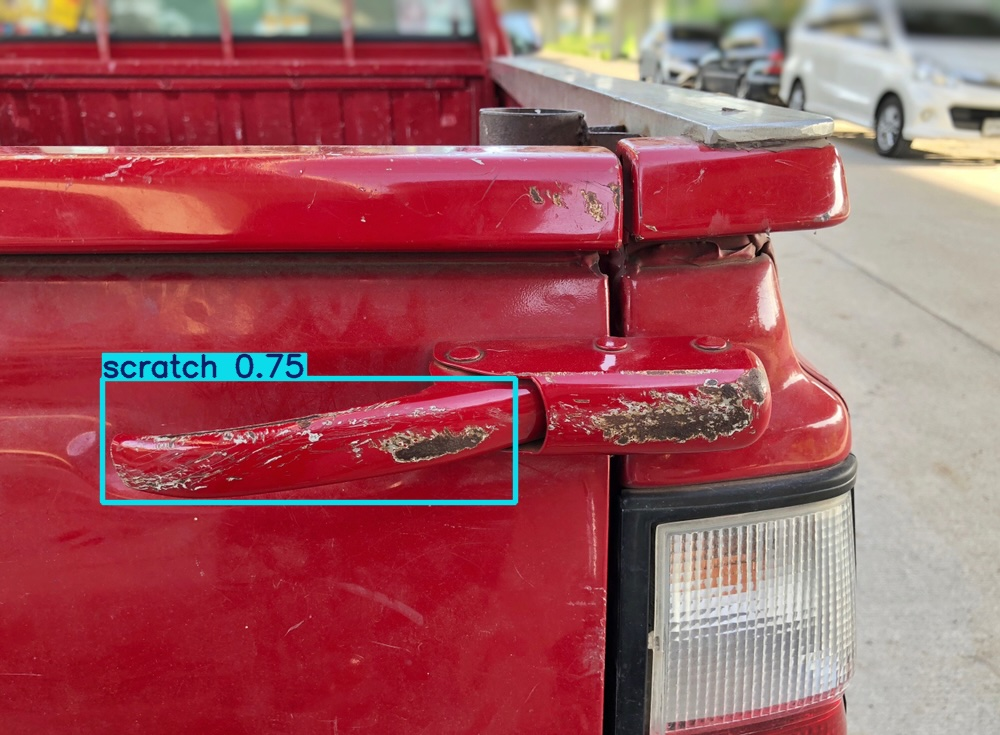

In [ ]:
# Third image
image

In [ ]:
# === Load and Prepare Image ===
image = Image.open("t4-ans.jpg").convert("RGB")


ans = """

🔧 Ranked Detections by Severity:
dent | Conf: 0.65 | Area: 44811 | Score: 58655 | BBox: (426.8338928222656, 150.44515991210938, 690.5633544921875, 320.3568420410156)
scratch | Conf: 0.54 | Area: 35654 | Score: 38613 | BBox: (292.55584716796875, 277.1870422363281, 469.99493408203125, 478.12237548828125)
"""

instruction = f"""You are an expert automobile inspector.
Review the image and verify whether the car damages shown are consistent with the following object detection results (ranked by severity):

{ans} Recall: {CLASS_WEIGHTS}

For each detected damage, return your analysis in the following structured format:

{{
    "general_description": <Long detailed assessment of all the  damages,  location and severity>,
    "damage_type": <type of damage, e.g., 'glass shatter'>,
    "qualitative_description_of_size_of_damage": <e.g., 'large', 'medium', 'minor'>,
    "technical_description_location_of_damage": <specific part of the car affected, e.g., 'front windshield, lower right'>,
    "recommendation_for_fix": <e.g., 'Replace the windshield', 'Polish the surface'>,
    "estimated_time_of_repair": <e.g., '2–3 hours of labor', '30 minutes for polishing'>
}}

Only include entries that are visible in the image. Be as precise and professional as possible.
"""

In [ ]:


# === Apply chat template ===
messages = [
    {
        "role": "user",
        "content": [
            {"type": "image", "image": image},
            {"type": "text", "text": instruction}
        ],
    }
]

# This returns a string formatted for chat prompting
input_text = processor.apply_chat_template(messages, add_generation_prompt=True)

# === Tokenize multimodal input ===
inputs = processor(
    text=input_text,
    images=image,
    return_tensors="pt"
).to("cuda")  # or "cpu" if needed

# === Generate and stream output ===
streamer = TextStreamer(processor.tokenizer, skip_prompt=True)

outputs = model.generate(
    **inputs,
    streamer=streamer,
    max_new_tokens=256,
    use_cache=True,
    temperature=1.0,
    top_p=0.95,
    top_k=64,
)


```json
{
    "general_description": "The vehicle has a dent on the front bumper, indicated by a blue bounding box and a confidence score of 0.65.",
    "damage_type": "dent",
    "qualitative_description_of_size_of_damage": "medium",
    "technical_description_location_of_damage": "Front bumper",
    "recommendation_for_fix": "Body repair",
    "estimated_time_of_repair": "2–3 hours of labor"
}
```<end_of_turn>


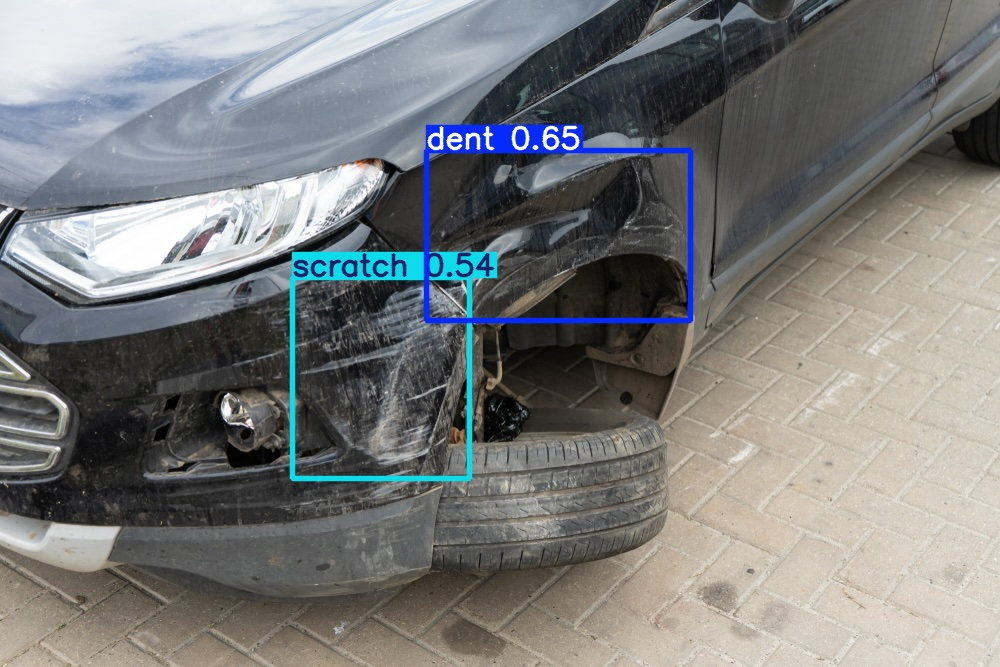

In [ ]:
# Fourth image
image

In [ ]:
# === Load and Prepare Image ===
image = Image.open("t5-ans.jpg").convert("RGB")


ans = """
🔧 Ranked Detections by Severity:
tire flat | Conf: 0.95 | Area: 107504 | Score: 102597 | BBox: (334.48419189453125, 197.11624145507812, 680.3424072265625, 507.9474182128906)
"""

# instruction_template = """You are an expert automobile inspector.
# Review the image and verify whether the car damages shown are consistent
# with the following object detection results (ranked by severity):

# ans{}

# Mention the damage types and whether they match what you see in the image.
# """

instruction = f"""You are an expert automobile inspector.
Review the image and verify whether the car damages shown are consistent with the following object detection results (ranked by severity):

{ans} Recall: {CLASS_WEIGHTS}

For each detected damage, return your analysis in the following structured format:

{{
    "general_description": <Long detailed assessment of all the  damages,  location and severity>,
    "damage_type": <type of damage, e.g., 'glass shatter'>,
    "qualitative_description_of_size_of_damage": <e.g., 'large', 'medium', 'minor'>,
    "technical_description_location_of_damage": <specific part of the car affected, e.g., 'front windshield, lower right'>,
    "recommendation_for_fix": <e.g., 'Replace the windshield', 'Polish the surface'>,
    "estimated_time_of_repair": <e.g., '2–3 hours of labor', '30 minutes for polishing'>
}}

Only include entries that are visible in the image. Be as precise and professional as possible.
"""

In [ ]:

# === Apply chat template ===
messages = [
    {
        "role": "user",
        "content": [
            {"type": "image", "image": image},
            {"type": "text", "text": instruction}
        ],
    }
]

# This returns a string formatted for chat prompting
input_text = processor.apply_chat_template(messages, add_generation_prompt=True)

# === Tokenize multimodal input ===
inputs = processor(
    text=input_text,
    images=image,
    return_tensors="pt"
).to("cuda")  # or "cpu" if needed

# === Generate and stream output ===
streamer = TextStreamer(processor.tokenizer, skip_prompt=True)

outputs = model.generate(
    **inputs,
    streamer=streamer,
    max_new_tokens=256,
    use_cache=True,
    temperature=1.0,
    top_p=0.95,
    top_k=64,
)


```json
{
    "general_description": "The image shows a car with a flat tire on the rear wheel.",
    "damage_type": "tire flat",
    "qualitative_description_of_size_of_damage": "Major",
    "technical_description_location_of_damage": "Rear tire",
    "recommendation_for_fix": "Replace the tire",
    "estimated_time_of_repair": "1–2 hours"
}
```<end_of_turn>


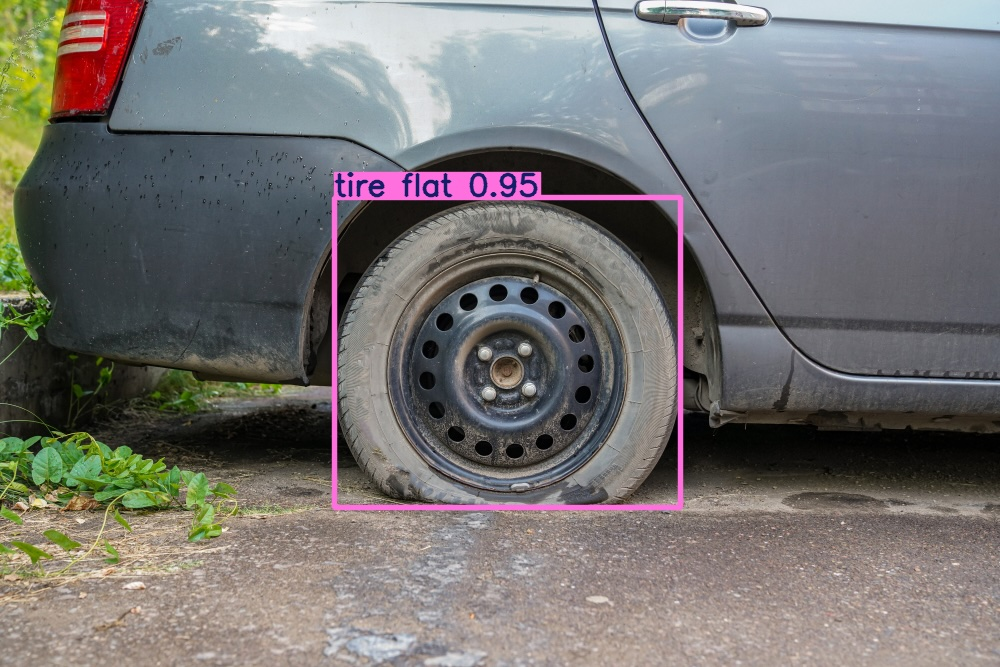

In [ ]:
# Fifth image
image

In [ ]:
# === Load and Prepare Image ===
image = Image.open("t6-ans.jpg").convert("RGB")


ans = """
🔧 Ranked Detections by Severity:
glass shatter | Conf: 0.92 | Area: 310722 | Score: 1424738 | BBox: (316.58477783203125, 124.11629486083984, 1000.0, 578.7765502929688)
"""

instruction = f"""You are an expert automobile inspector.
Review the image and verify whether the car damages shown are consistent with the following object detection results (ranked by severity):

{ans} Recall: {CLASS_WEIGHTS}

For each detected damage, return your analysis in the following structured format:

{{
    "general_description": <Long detailed assessment of all the  damages,  location and severity>,
    "damage_type": <type of damage, e.g., 'glass shatter'>,
    "qualitative_description_of_size_of_damage": <e.g., 'large', 'medium', 'minor'>,
    "technical_description_location_of_damage": <specific part of the car affected, e.g., 'front windshield, lower right'>,
    "recommendation_for_fix": <e.g., 'Replace the windshield', 'Polish the surface'>,
    "estimated_time_of_repair": <e.g., '2–3 hours of labor', '30 minutes for polishing'>
}}

Only include entries that are visible in the image. Be as precise and professional as possible.
"""

In [ ]:
# === Apply chat template ===
messages = [
    {
        "role": "user",
        "content": [
            {"type": "image", "image": image},
            {"type": "text", "text": instruction}
        ],
    }
]

# This returns a string formatted for chat prompting
input_text = processor.apply_chat_template(messages, add_generation_prompt=True)

# === Tokenize multimodal input ===
inputs = processor(
    text=input_text,
    images=image,
    return_tensors="pt"
).to("cuda")  # or "cpu" if needed

# === Generate and stream output ===
streamer = TextStreamer(processor.tokenizer, skip_prompt=True)

outputs = model.generate(
    **inputs,
    streamer=streamer,
    max_new_tokens=256,
    use_cache=True,
    temperature=1.0,
    top_p=0.95,
    top_k=64,
)


```json
{
    "general_description": "The image shows a car with a cracked windshield. The crack appears to be a single, relatively thin line across the center of the windshield.",
    "damage_type": "glass shatter",
    "qualitative_description_of_size_of_damage": "minor",
    "technical_description_location_of_damage": "windshield",
    "recommendation_for_fix": "Replace the windshield",
    "estimated_time_of_repair": "2–3 hours of labor"
}
```<end_of_turn>


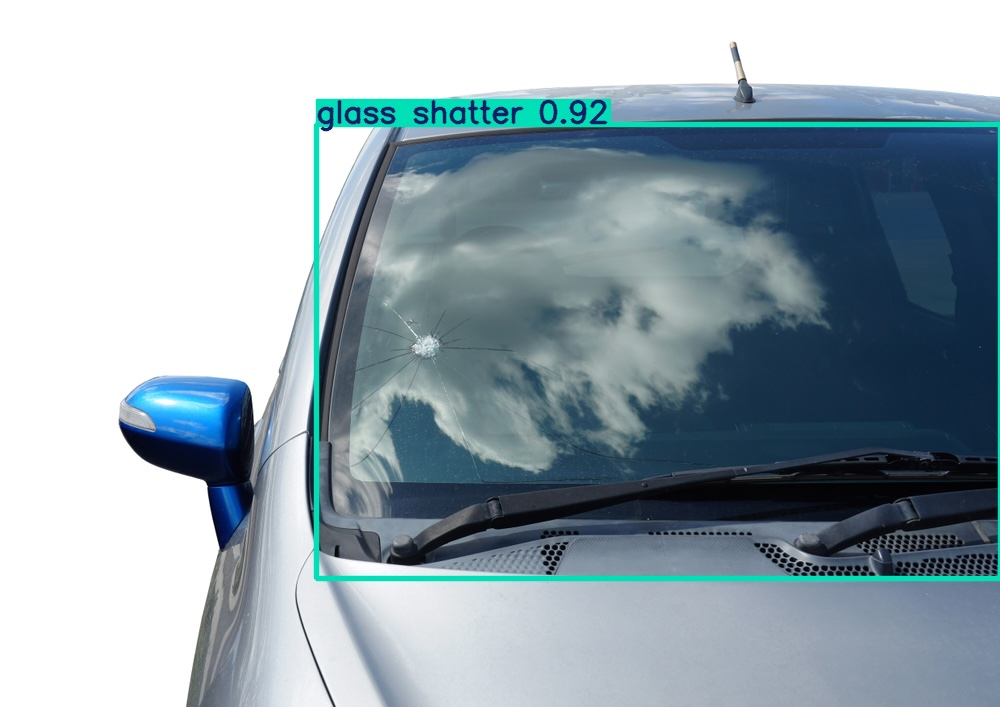

In [ ]:
# Sixth image
image

In [ ]:
# === Load and Prepare Image ===
image = Image.open("t7-ans.jpg").convert("RGB")


ans = """
🔧 Ranked Detections by Severity:
glass shatter | Conf: 0.57 | Area: 76971 | Score: 219510 | BBox: (137.87876892089844, 170.117431640625, 648.8028564453125, 320.7686462402344)
glass shatter | Conf: 0.67 | Area: 32302 | Score: 107768 | BBox: (115.6725845336914, 86.38443756103516, 501.7813720703125, 170.0445556640625)
dent | Conf: 0.81 | Area: 23407 | Score: 37810 | BBox: (53.721397399902344, 237.39886474609375, 215.58387756347656, 382.0122375488281)
scratch | Conf: 0.36 | Area: 33186 | Score: 23714 | BBox: (127.98844909667969, 384.0025939941406, 321.5174560546875, 555.47900390625)
scratch | Conf: 0.36 | Area: 5353 | Score: 3887 | BBox: (672.78857421875, 274.9032287597656, 753.4305419921875, 341.28192138671875)
"""

instruction = f"""You are an expert automobile inspector.
Review the image and verify whether the car damages shown are consistent with the following object detection results (ranked by severity):

{ans} Recall: {CLASS_WEIGHTS}

For the detected damages, in a combined fashion return your analysis in the following structured format:


{{
    "general_description": <Long detailed assessment of all the  damages,  location and severity>,
    "damage_type": <types of damages observed, e.g., 'glass shatter'>,
    "qualitative_description_of_size_of_damage": <for each of the items discovered e.g., 'large', 'medium', 'minor'>,
    "technical_description_location_of_damage": <specific parts of the car affected, e.g., 'front windshield, lower right'>,
    "recommendation_for_fix": < Recommendation for fix for each part e.g., 'Replace the windshield', 'Polish the surface'>,
    "estimated_time_of_repair": <e.g., '2–3 hours of labor', '30 minutes for polishing'>
}}

Only include entries that are visible in the image. Be as precise and professional as possible.
"""

In [ ]:

# === Apply chat template ===
messages = [
    {
        "role": "user",
        "content": [
            {"type": "image", "image": image},
            {"type": "text", "text": instruction}
        ],
    }
]

# This returns a string formatted for chat prompting
input_text = processor.apply_chat_template(messages, add_generation_prompt=True)

# === Tokenize multimodal input ===
inputs = processor(
    text=input_text,
    images=image,
    return_tensors="pt"
).to("cuda")  # or "cpu" if needed

# === Generate and stream output ===
streamer = TextStreamer(processor.tokenizer, skip_prompt=True)

outputs = model.generate(
    **inputs,
    streamer=streamer,
    max_new_tokens=256,
    use_cache=True,
    temperature=1.0,
    top_p=0.95,
    top_k=64,
)


```json
{
    "general_description": "The vehicle has sustained damage to the front end, including a dent and multiple instances of glass shattering. The glass shatter appears to be extensive, while the dent is a more localized impact.",
    "damage_type": "glass shatter, dent, scratch",
    "qualitative_description_of_size_of_damage": "Extensive glass shattering, localized dent, minor scratches",
    "technical_description_location_of_damage": "Front of the vehicle, specifically the hood and front bumper area.",
    "recommendation_for_fix": "Replace the windshield, repair the dent.",
    "estimated_time_of_repair": "Replace the windshield (2–3 hours), repair the dent (1–2 hours)"
}
```<end_of_turn>


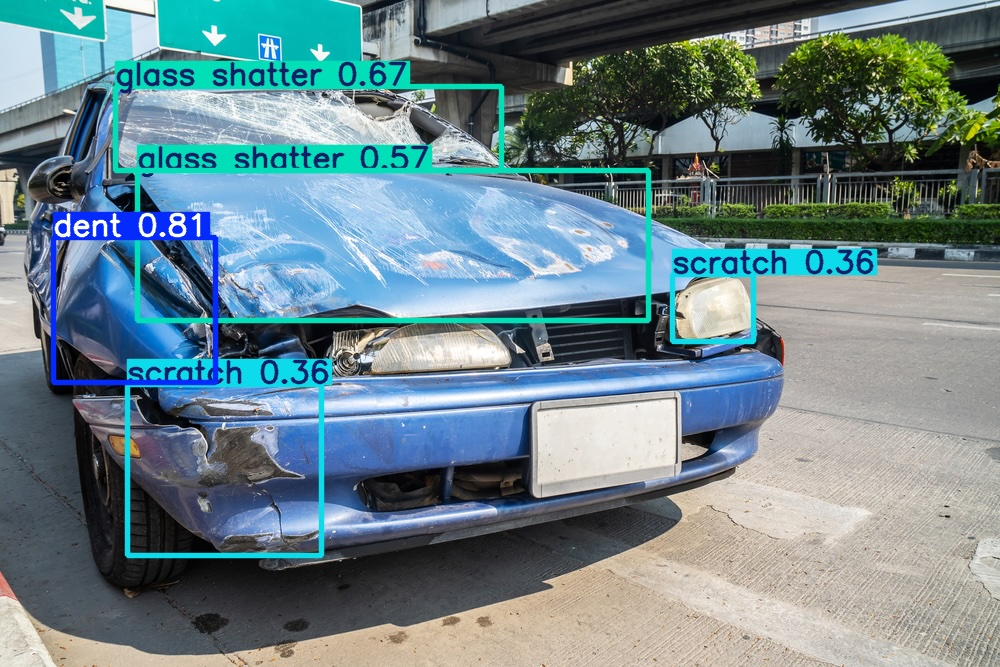

In [ ]:
# Seven image
image

In [ ]:
# === Load and Prepare Image ===
image = Image.open("t8-ans.jpg").convert("RGB")


ans = """
🔧 Ranked Detections by Severity:
dent | Conf: 0.84 | Area: 297686 | Score: 498781 | BBox: (446.3674621582031, 32.0871467590332, 930.2183837890625, 647.3301391601562)
"""
instruction = f"""You are an expert automobile inspector.
Review the image and verify whether the car damages shown are consistent with the following object detection results (ranked by severity):

{ans} Recall: {CLASS_WEIGHTS}

For the detected damages, in a combined fashion return your analysis in the following structured format:


{{
    "general_description": <Long detailed assessment of all the  damages,  location and severity>,
    "damage_type": <types of damages observed, e.g., 'glass shatter'>,
    "qualitative_description_of_size_of_damage": <for each of the items discovered e.g., 'large', 'medium', 'minor'>,
    "technical_description_location_of_damage": <specific parts of the car affected, e.g., 'front windshield, lower right'>,
    "recommendation_for_fix": < Recommendation for fix for each part e.g., 'Replace the windshield', 'Polish the surface'>,
    "estimated_time_of_repair": <e.g., '2–3 hours of labor', '30 minutes for polishing'>
}}

Only include entries that are visible in the image. Be as precise and professional as possible.
"""

In [ ]:
# === Apply chat template ===
messages = [
    {
        "role": "user",
        "content": [
            {"type": "image", "image": image},
            {"type": "text", "text": instruction}
        ],
    }
]

# This returns a string formatted for chat prompting
input_text = processor.apply_chat_template(messages, add_generation_prompt=True)

# === Tokenize multimodal input ===
inputs = processor(
    text=input_text,
    images=image,
    return_tensors="pt"
).to("cuda")  # or "cpu" if needed

# === Generate and stream output ===
streamer = TextStreamer(processor.tokenizer, skip_prompt=True)

outputs = model.generate(
    **inputs,
    streamer=streamer,
    max_new_tokens=256,
    use_cache=True,
    temperature=1.0,
    top_p=0.95,
    top_k=64,
)


```json
{
    "general_description": "The image shows a dent on the side of the car.",
    "damage_type": "dent",
    "qualitative_description_of_size_of_damage": "medium",
    "technical_description_location_of_damage": "Side of the car",
    "recommendation_for_fix": "Body repair",
    "estimated_time_of_repair": "2–3 hours of labor"
}
```<end_of_turn>


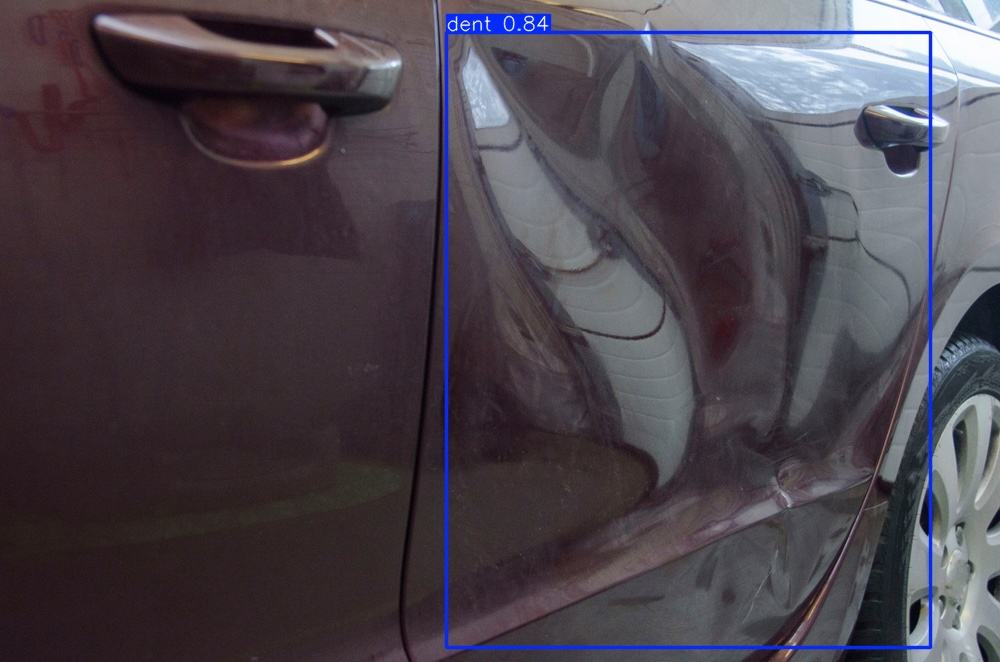

In [ ]:
# Eighth image
image

In [ ]:
# import torch
# torch.cuda.empty_cache()

In [ ]:
# from transformers import VisionEncoderDecoderPipeline